In [1]:
import sys
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sns.set_theme(style = "ticks", context = "talk", palette = "bright")

def initFilesNames():
        filesNames = []
        for x in range(100, 1000, 100):
	        for y in range(1, 4):
  		        filesNames.append('B0' + str(x + y) + 'T')
        return filesNames

TRAIN_PATH    = '../data/raw/train/'
TRAIN_CLEAN_PATH    = '../data/raw/train_clean/'
TRAIN_ONLY_PATH    = '../data/raw/y_train_only/'
FILES   = initFilesNames()

def loadFile(filePathName):
    return { 'fileName': filePathName, 'data': pd.read_csv(filePathName)}

In [4]:

def firstExploreFile(fileName):
        print(fileName)
        df = pd.read_csv(TRAIN_PATH + fileName)
        print(df.head())
        print(df.describe())
        print(df.info())
        print(df['EventStart'].value_counts())
        dfy = pd.read_csv(TRAIN_ONLY_PATH + fileName)
        print(dfy.head())
        print(dfy.describe())
        print(dfy['EventType'].value_counts())    
                
for f in FILES:
     firstExploreFile(f + '.csv')


B0101T.csv
   time        C3        Cz        C4   EOG:ch01   EOG:ch02   EOG:ch03  \
0     0  4.150454  0.192264  0.225834 -20.263981  18.738079  -5.889982   
1     4  4.446479  1.913481  4.299992  -6.561379  41.260395  12.726024   
2     8  2.200351  3.363088  2.221714 -13.031205  53.864347  20.080873   
3    12  0.186160  1.181048 -0.872816 -37.079423  28.839551   6.775006   
4    16  3.909361  3.921569  5.008011  -3.692683  67.566949  45.563439   

   EventStart  
0           0  
1           0  
2           0  
3           0  
4           0  
               time             C3             Cz             C4  \
count  6.048030e+05  604803.000000  604803.000000  604803.000000   
mean   1.209604e+06      -0.108466      -0.111282      -0.110543   
std    6.983669e+05       5.604448       4.856616       5.780675   
min    0.000000e+00    -100.001526    -100.001526    -100.001526   
25%    6.048020e+05      -2.700847      -2.447547      -2.859541   
50%    1.209604e+06      -0.094606      

In [48]:
from pathlib import Path
import csv

def index_file(filePathName):
        file = open(filePathName,'r')
        line_offset = []
        offset = 0
        for line in file:
                line_offset.append(offset)
                offset += len(line)
        file.close()
        return line_offset

def seek_line(file, line_number, line_offset):
        file.seek(0)
        file.seek(line_offset[line_number])
   
def create_clean_file(ifileName):
        file_clean = Path(TRAIN_CLEAN_PATH +  ifileName + '.csv')
        if file_clean.exists():
                file_clean.unlink()
        fileName = ifileName + '.csv'
        with open(TRAIN_PATH + fileName, newline='') as trainFile:
                numLign = 0
                numEvent = 1
                fileIndex = index_file(TRAIN_ONLY_PATH +  fileName)
                yFile = open(TRAIN_ONLY_PATH +  fileName,'r')
                with open(TRAIN_CLEAN_PATH +  fileName, 'w', newline='') as cleanFile:
                        cleanWriter = csv.writer(cleanFile)
                        trainReader = csv.reader(trainFile)
                        currentEvent = ''
                        for row in trainReader:
                                if numLign == 0:
                                        header = row[: 4]
                                        header.append('EventStart')
                                        header.append('EventType')
                                        cleanWriter.writerow(header)
                                else:
                                        newRow = row[: 4]
                                        eventStart = row[7]
                                        newRow.append(eventStart)  
                                        if eventStart != '0':
                                                seek_line(yFile, numEvent, fileIndex)
                                                yReader = csv.reader(yFile)
                                                for yLign in yReader:
                                                        numEvent += 1
                                                        currentEvent = yLign[0]                                        
                                                        break
                                        if (numEvent == 1):
                                                numLign += 1
                                                #continue
                                        newRow.append(currentEvent)
                                        cleanWriter.writerow(newRow)
                                numLign += 1
                yFile.close()
        df = pd.read_csv(TRAIN_CLEAN_PATH +  fileName)
        print(df.describe())
        print(df.info())
        print(df['EventType'].value_counts())  
        
def create_clean_files():
        dir_clean = Path(TRAIN_CLEAN_PATH)
        if not dir_clean.exists():
                dir_clean.mkdir(parents=False, exist_ok=True)
        for file in FILES:
                create_clean_file(file)                                       

create_clean_files()


               time             C3             Cz             C4  \
count  6.048030e+05  604803.000000  604803.000000  604803.000000   
mean   1.209604e+06      -0.108466      -0.111282      -0.110543   
std    6.983669e+05       5.604448       4.856616       5.780675   
min    0.000000e+00    -100.001526    -100.001526    -100.001526   
25%    6.048020e+05      -2.700847      -2.447547      -2.859541   
50%    1.209604e+06      -0.094606      -0.036622      -0.119020   
75%    1.814406e+06       2.490272       2.380407       2.627604   
max    2.419208e+06      55.582513      21.884489      49.359884   

          EventStart      EventType  
count  604803.000000  548914.000000  
mean        0.000198       0.514729  
std         0.014084       0.499783  
min         0.000000       0.000000  
25%         0.000000       0.000000  
50%         0.000000       1.000000  
75%         0.000000       1.000000  
max         1.000000       1.000000  
<class 'pandas.core.frame.DataFrame'>
RangeIn

In [3]:
def view(loadedFile, min=0, max=sys.maxsize, ylim=100):
    df = loadedFile['data']
    df = df.loc[(df['time']>min) & (df['time']< max)]
    fig,axes = plt.subplots(nrows = 4,sharex = True, figsize = (50, 16))
    axes[0].set_ylim([-ylim,ylim])
    axes[1].set_ylim([-ylim,ylim])
    axes[2].set_ylim([-ylim,ylim])
    axes[0].set_title('Intensité C3, Cz,C4 en fonction du temps : ' +  loadedFile['fileName'])
    sns.lineplot( ax=axes[0], x = 'time', y = 'C3', color='red', label='C3', legend=False, data = df, alpha=0.5)
    sns.lineplot( ax=axes[1], x = 'time', y = 'Cz', color='orange' , label='Cz', legend=False, data = df, alpha=0.5)
    sns.lineplot( ax=axes[2], x = 'time', y = 'C4', color='purple' , label='C4', legend=False, data = df, alpha=0.5)
    sns.scatterplot( ax=axes[3], x = 'time', y = 'EventStart', hue = 'EventType', marker= 'v', s=250, palette=['green', 'magenta'], alpha=1, legend=True, data = df.loc[df['EventStart']==1])
    plt.show() 
    
def firstViewAll():
        for file in FILES:
            view(loadFile(TRAIN_CLEAN_PATH + file +'.csv'))
    



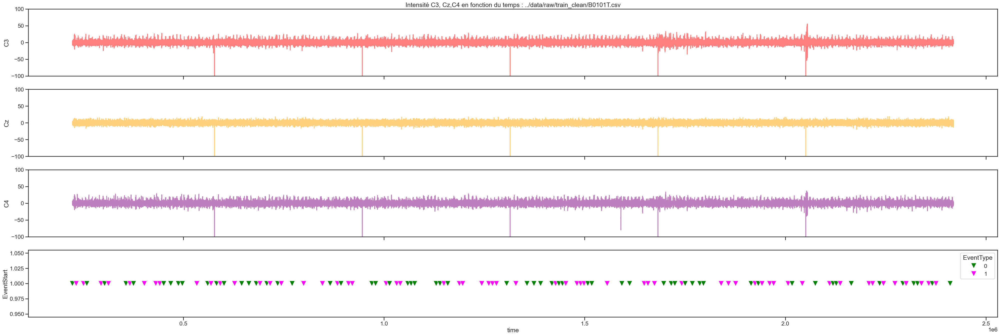

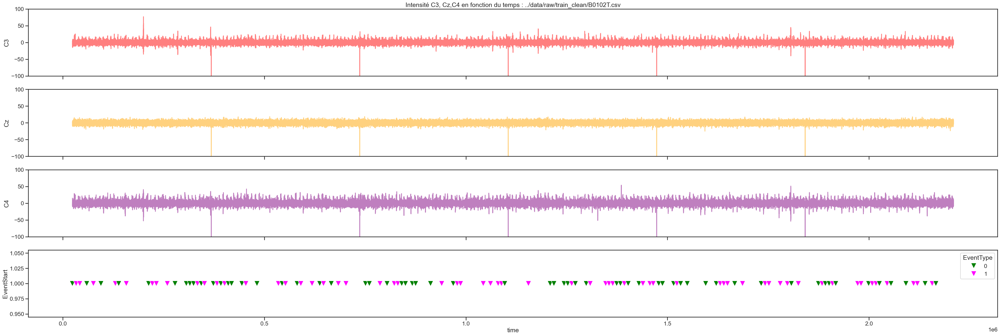

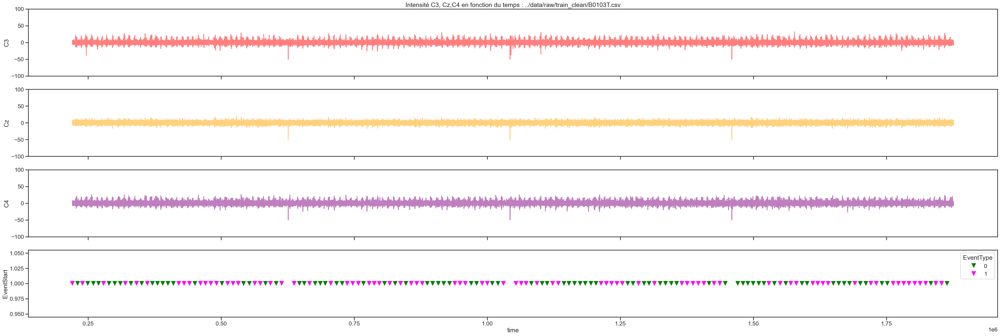

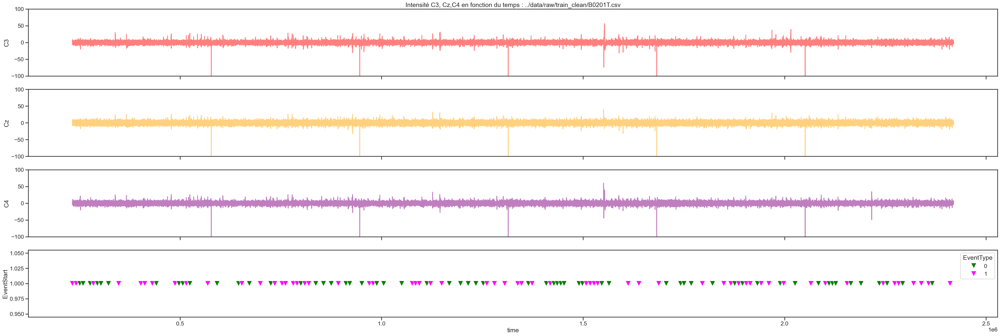

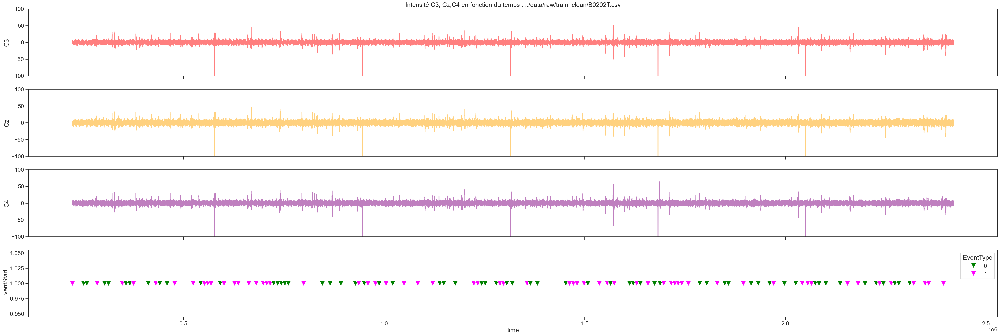

...

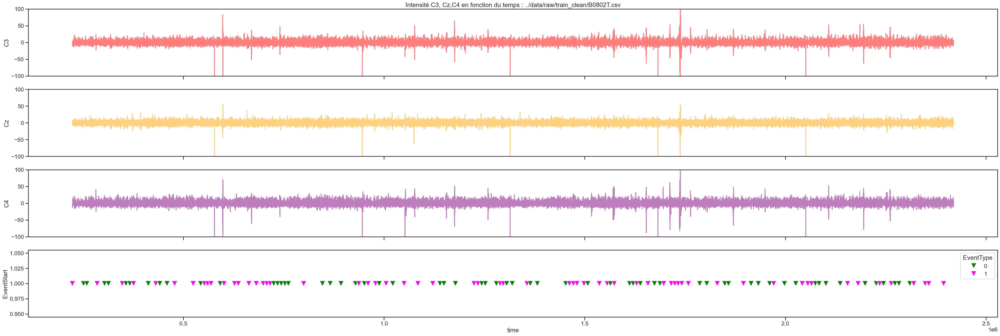

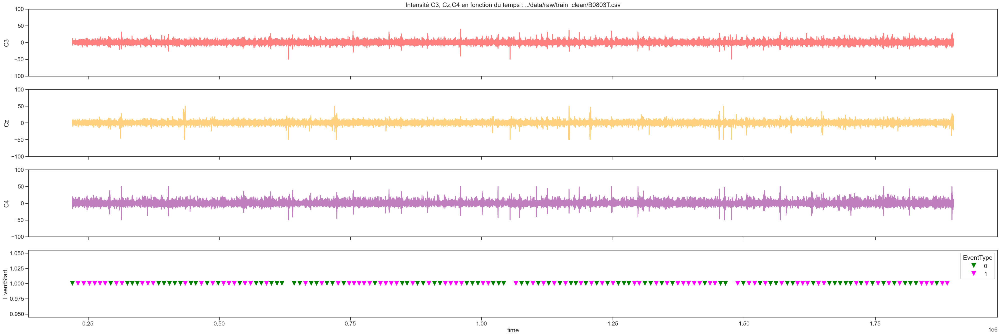

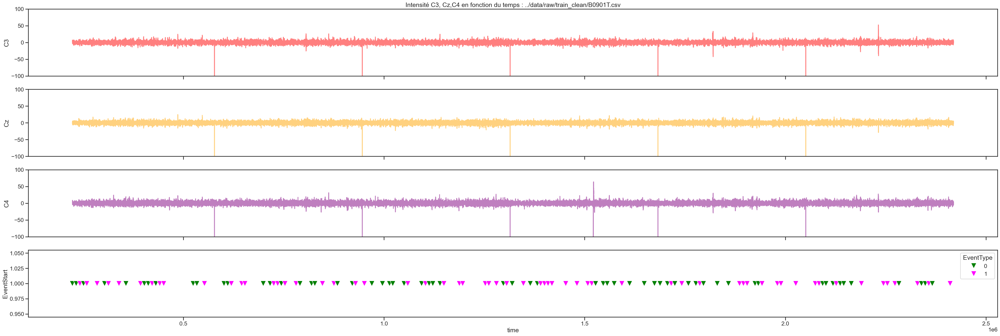

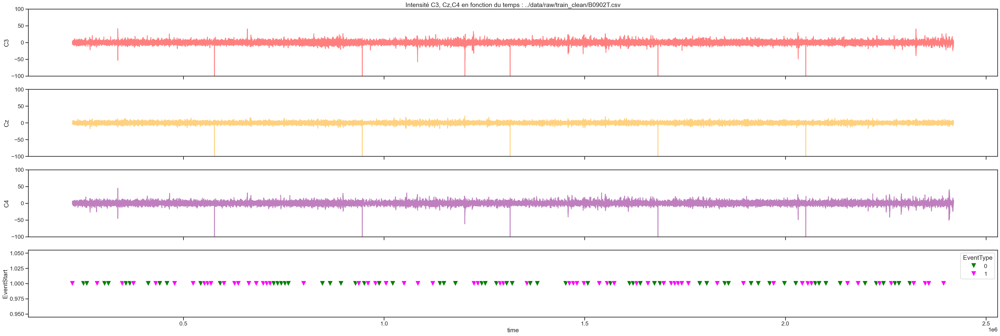

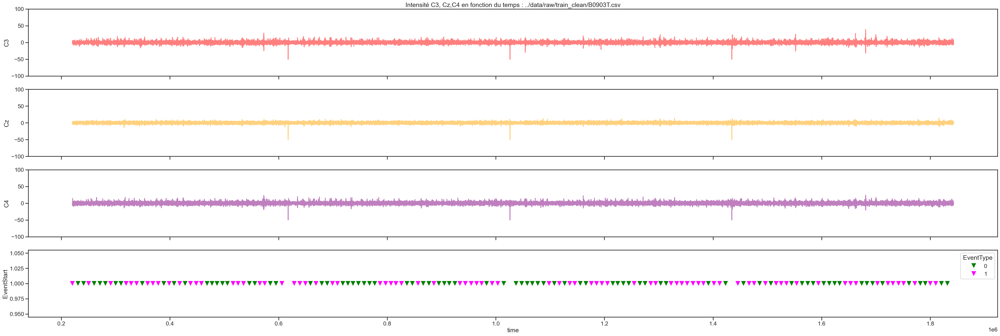

In [3]:
firstViewAll()

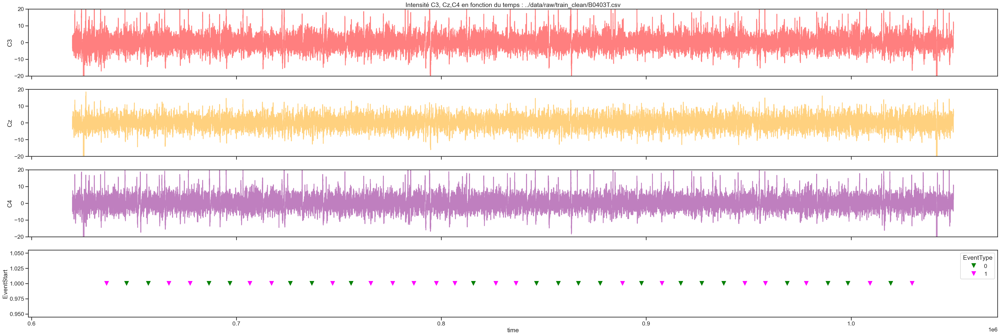

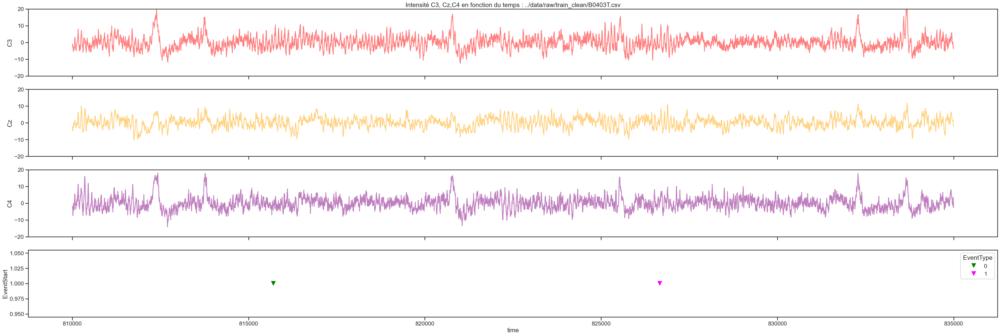

In [4]:
b0403t = loadFile(TRAIN_CLEAN_PATH + 'B0403T' + '.csv')
min = 620000
max = 1050000
view(b0403t, min=min, max=max, ylim=20)
min = 810000
max = 835000
view(b0403t, min=min, max=max, ylim=20)

810000 835000
<class 'pandas.core.frame.DataFrame'>
Index: 6249 entries, 202501 to 208749
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   C3          6249 non-null   float64
 1   Cz          6249 non-null   float64
 2   C4          6249 non-null   float64
 3   EventStart  6249 non-null   int64  
dtypes: float64(3), int64(1)
memory usage: 244.1 KB
None
[[1.99755800e-05 1.91208791e-05 2.07814408e-05 ... 5.83638584e-06
  6.10500611e-06 3.61416361e-06]
 [9.52380952e-07 7.08180708e-07 1.70940171e-06 ... 5.83638584e-06
  3.49206349e-06 9.76800977e-07]
 [3.80952381e-06 4.27350427e-06 4.78632479e-06 ... 5.56776557e-06
  2.95482295e-06 8.79120879e-07]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


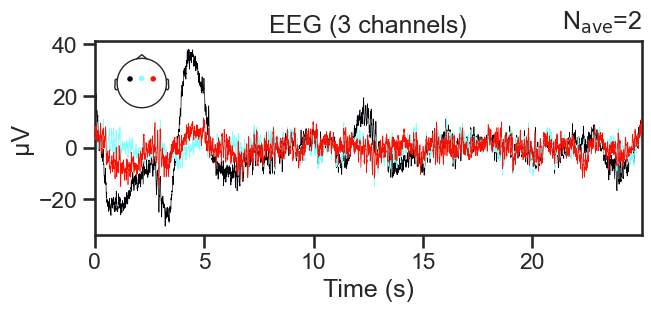

No projector specified for this dataset. Please consider the method self.add_proj.


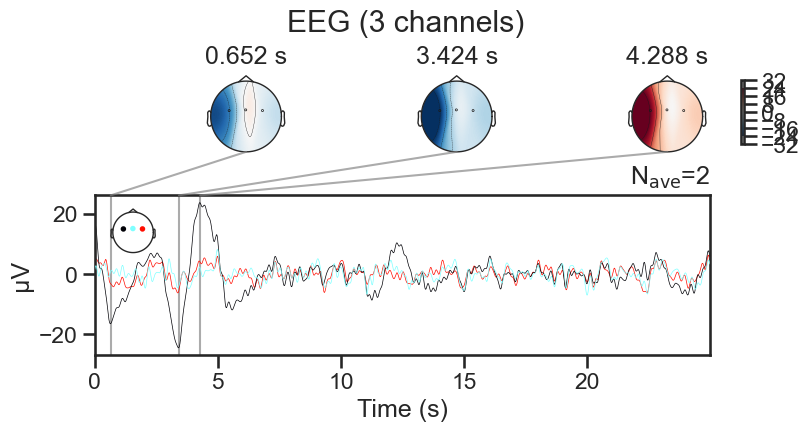

NOTE: plot_psd_topomap() is a legacy function. New code should use .compute_psd().plot_topomap().
    Using multitaper spectrum estimation with 7 DPSS windows


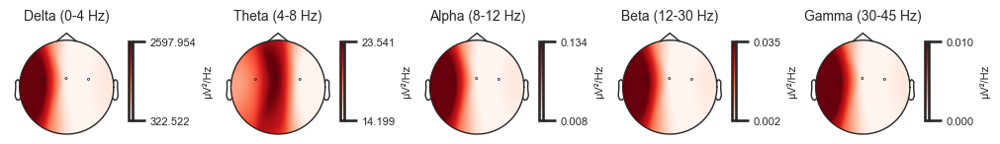

810000 835000
<class 'pandas.core.frame.DataFrame'>
Index: 6249 entries, 202501 to 208749
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   C3          6249 non-null   float64
 1   Cz          6249 non-null   float64
 2   C4          6249 non-null   float64
 3   EventStart  6249 non-null   int64  
dtypes: float64(3), int64(1)
memory usage: 244.1 KB
None
[[1.99755800e-05 1.91208791e-05 2.07814408e-05 ... 5.83638584e-06
  6.10500611e-06 3.61416361e-06]
 [9.52380952e-07 7.08180708e-07 1.70940171e-06 ... 5.83638584e-06
  3.49206349e-06 9.76800977e-07]
 [3.80952381e-06 4.27350427e-06 4.78632479e-06 ... 5.56776557e-06
  2.95482295e-06 8.79120879e-07]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


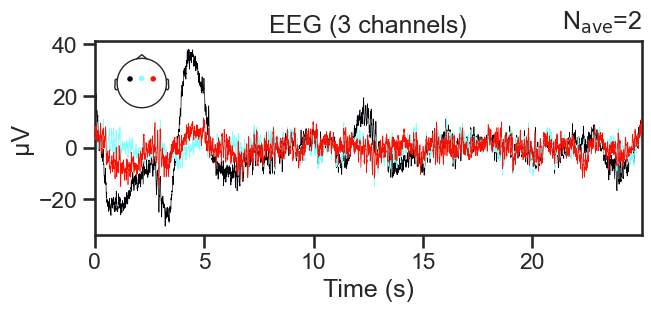

No projector specified for this dataset. Please consider the method self.add_proj.


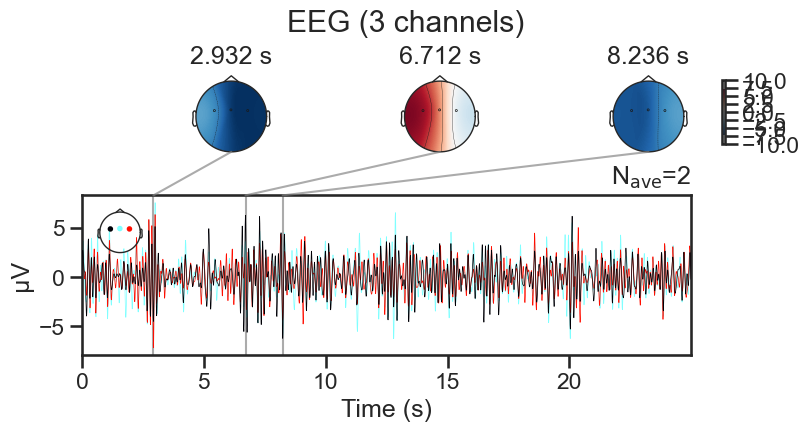

NOTE: plot_psd_topomap() is a legacy function. New code should use .compute_psd().plot_topomap().
    Using multitaper spectrum estimation with 7 DPSS windows


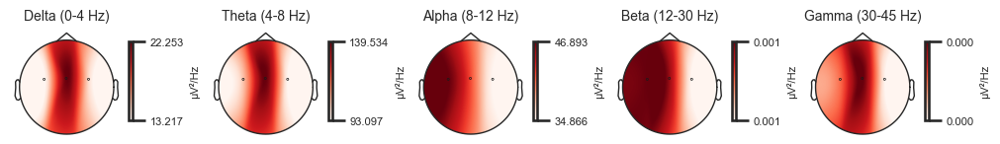

810000 835000
<class 'pandas.core.frame.DataFrame'>
Index: 6249 entries, 202501 to 208749
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   C3          6249 non-null   float64
 1   Cz          6249 non-null   float64
 2   C4          6249 non-null   float64
 3   EventStart  6249 non-null   int64  
dtypes: float64(3), int64(1)
memory usage: 244.1 KB
None
[[1.99755800e-05 1.91208791e-05 2.07814408e-05 ... 5.83638584e-06
  6.10500611e-06 3.61416361e-06]
 [9.52380952e-07 7.08180708e-07 1.70940171e-06 ... 5.83638584e-06
  3.49206349e-06 9.76800977e-07]
 [3.80952381e-06 4.27350427e-06 4.78632479e-06 ... 5.56776557e-06
  2.95482295e-06 8.79120879e-07]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


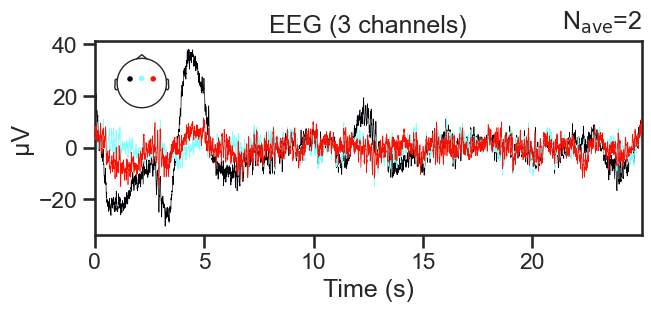

No projector specified for this dataset. Please consider the method self.add_proj.


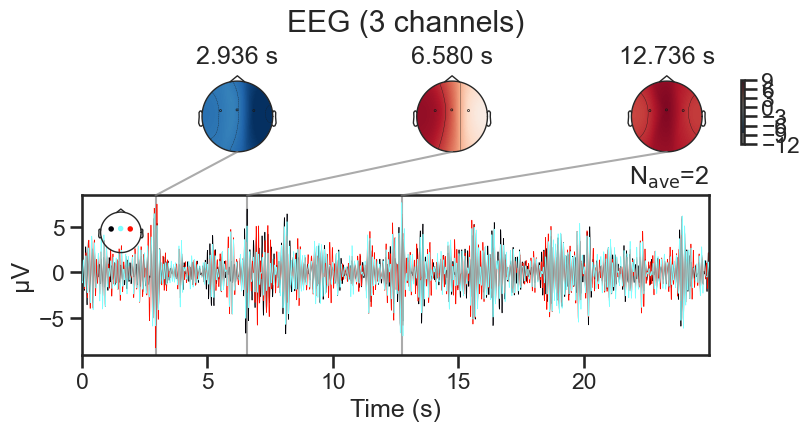

NOTE: plot_psd_topomap() is a legacy function. New code should use .compute_psd().plot_topomap().
    Using multitaper spectrum estimation with 7 DPSS windows


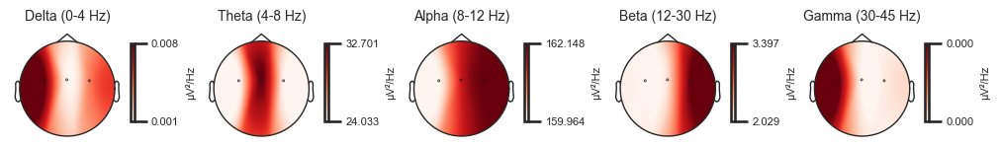

810000 835000
<class 'pandas.core.frame.DataFrame'>
Index: 6249 entries, 202501 to 208749
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   C3          6249 non-null   float64
 1   Cz          6249 non-null   float64
 2   C4          6249 non-null   float64
 3   EventStart  6249 non-null   int64  
dtypes: float64(3), int64(1)
memory usage: 244.1 KB
None
[[1.99755800e-05 1.91208791e-05 2.07814408e-05 ... 5.83638584e-06
  6.10500611e-06 3.61416361e-06]
 [9.52380952e-07 7.08180708e-07 1.70940171e-06 ... 5.83638584e-06
  3.49206349e-06 9.76800977e-07]
 [3.80952381e-06 4.27350427e-06 4.78632479e-06 ... 5.56776557e-06
  2.95482295e-06 8.79120879e-07]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


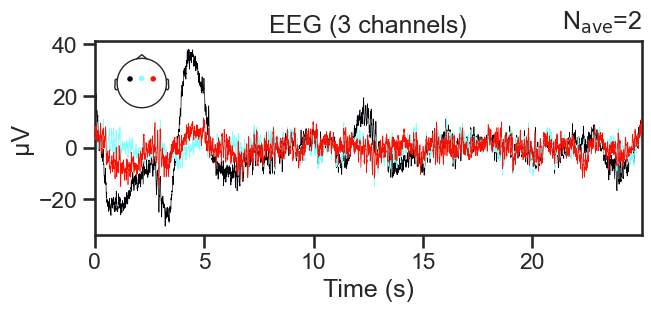

No projector specified for this dataset. Please consider the method self.add_proj.


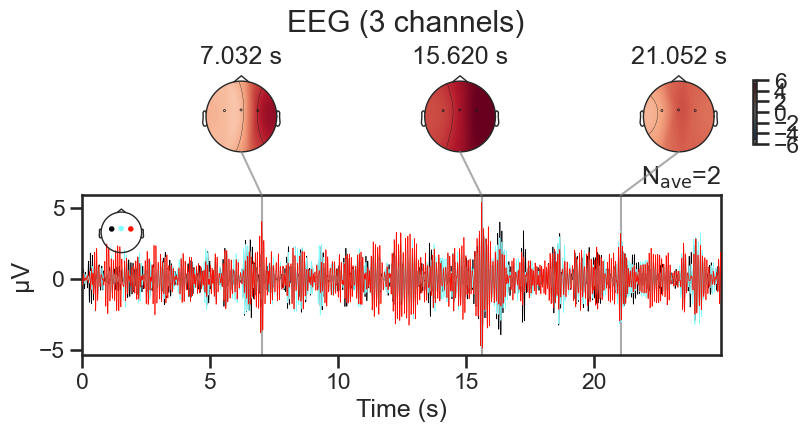

NOTE: plot_psd_topomap() is a legacy function. New code should use .compute_psd().plot_topomap().
    Using multitaper spectrum estimation with 7 DPSS windows


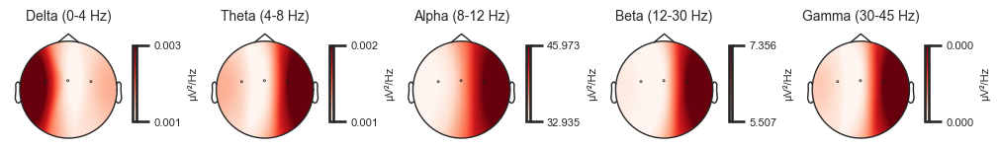

810000 835000
<class 'pandas.core.frame.DataFrame'>
Index: 6249 entries, 202501 to 208749
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   C3          6249 non-null   float64
 1   Cz          6249 non-null   float64
 2   C4          6249 non-null   float64
 3   EventStart  6249 non-null   int64  
dtypes: float64(3), int64(1)
memory usage: 244.1 KB
None
[[1.99755800e-05 1.91208791e-05 2.07814408e-05 ... 5.83638584e-06
  6.10500611e-06 3.61416361e-06]
 [9.52380952e-07 7.08180708e-07 1.70940171e-06 ... 5.83638584e-06
  3.49206349e-06 9.76800977e-07]
 [3.80952381e-06 4.27350427e-06 4.78632479e-06 ... 5.56776557e-06
  2.95482295e-06 8.79120879e-07]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


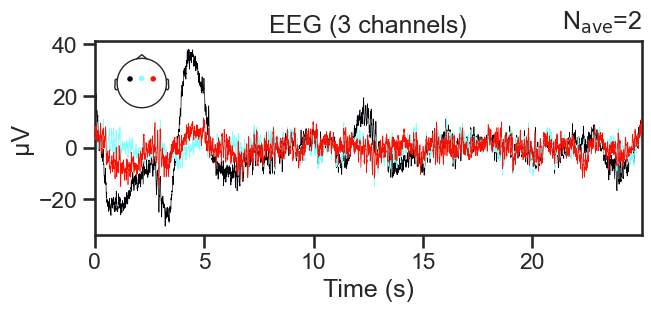

No projector specified for this dataset. Please consider the method self.add_proj.


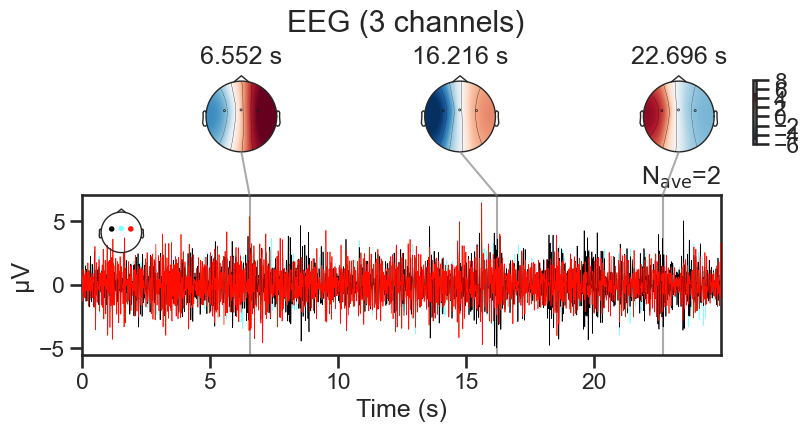

NOTE: plot_psd_topomap() is a legacy function. New code should use .compute_psd().plot_topomap().
    Using multitaper spectrum estimation with 7 DPSS windows


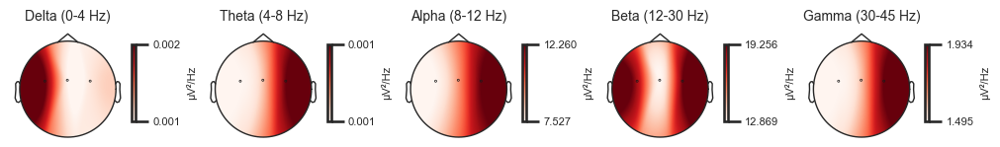

In [50]:
import mne
channel_list_fixed = ['C3','Cz','C4','EventStart']
sampling_freq = 250  # in Hertz
filters = [{ 'name': 'delta',
             'lPass':0.5,
             'hPass':4},
           { 'name':'theta',
             'lPass':4, 
             'hPass':8},
           { 'name': 'alpha',
             'lPass':8, 
             'hPass':12},
           {'name':'smr',
            'lPass':12,
            'hPass':15},
           { 'name':'beta',
            'lPass':13, 
            'hPass':30}]
        


def plot_eeg_topomap(signal_array, save_path_animation=None, show_names=False, start_time=0.05, end_time=1, step_size=0.05):
    # select channel X,Y format
    montage = mne.channels.make_standard_montage('standard_1020')
    
    # remove channels that don't have X,Y positions
    ch_to_remove = []
    for ch in channel_list_fixed:
        if ch not in list(set(montage.ch_names).intersection(channel_list_fixed)):
            ch_to_remove.append(channel_list_fixed.index(ch))
    arr = np.delete(signal_array.copy(), ch_to_remove, axis=0)
    
    # create info+evoked objects
    info = mne.create_info(ch_names=list(set(montage.ch_names).intersection(channel_list_fixed)), sfreq=sampling_freq, ch_types='eeg')
    evoked = mne.EvokedArray(arr, info)
    
    # set channel X,Y positions
    evoked.set_montage(montage)

    # plot img
    evoked.plot_topomap(np.arange(start_time, end_time, step_size), ch_type='eeg', time_unit='s', ncols=5, nrows=15, show_names=show_names)
    
def plot_eeg_topomap_animation(signal_array, save_path_animation, start_time=0.00, end_time=1, step_size=0.01, frame_rate=10):
    # select channel X,Y format
    montage = mne.channels.make_standard_montage('standard_1020')
    
    # remove channels that don't have X,Y positions
    ch_to_remove = []
    for ch in channel_list_fixed:
        if ch not in list(set(montage.ch_names).intersection(channel_list_fixed)):
            ch_to_remove.append(channel_list_fixed.index(ch))
    arr = np.delete(signal_array.copy(), ch_to_remove, axis=0)
    
    # create info+evoked objects
    info = mne.create_info(ch_names=list(set(montage.ch_names).intersection(channel_list_fixed)), sfreq=sampling_freq, ch_types='eeg')
    evoked = mne.EvokedArray(arr, info)
    
    # set channel X,Y positions
    evoked.set_montage(montage)
    
    # (optional) plot and save animation
    if save_path_animation:
        fig, anim = evoked.animate_topomap(times=np.arange(start_time, end_time, step_size), frame_rate=frame_rate, butterfly=True, blit=False )
        anim.save(save_path_animation)
        print('saved to', save_path_animation)

def viewMne(fileNamePath, verbose=False, lPass=0, hPass=120):
    loadedFile = loadFile(fileNamePath)
    df_mne = loadedFile['data']
    print(min, max)
    df = df_mne.loc[ (df_mne.time > min) & (df_mne.time < max ) ,channel_list_fixed]
    print(df.info())
    data= pd.DataFrame.to_numpy(df_mne.loc[ (df_mne.time > min) & (df_mne.time < max ) ,channel_list_fixed].transpose(), dtype= np.float64)
    data = data/1000000
    print(data)
    info = mne.create_info(ch_names=channel_list_fixed, sfreq=sampling_freq, ch_types=['eeg', 'eeg','eeg', 'stim'])
    raw = mne.EvokedArray(data, info, nave=2)
    #raw = mne.io.RawArray(data, info)
    standard_1020_montage = mne.channels.make_standard_montage('standard_1020')
    raw.set_montage(standard_1020_montage)
    #raw.plot_psd()
    raw_filtered = raw.copy().filter(lPass,hPass, verbose=False)
    #raw_filtered.plot_psd()

    #plt.imshow(raw_filtered.get_data())
    #plt.show()

    #if (verbose):
    raw.plot()
    #raw_filtered.plot_image()
    raw_filtered.plot_joint()
    raw_filtered.plot_psd_topomap()
    #raw.plot_sensors(show_names=True)

    #plot_eeg_topomap(raw_filtered.get_data(), show_names=True, end_time=(max-min)/10000)
    #if (verbose):
    #    plot_eeg_topomap_animation(raw_filtered.get_data(), loadedFile['fileName'][:len(loadedFile['fileName']) - 4]  + '.gif', end_time=(max-min)/10000, step_size=0.005, frame_rate=150)

min = 810000
max = 835000
for filter in filters:
    viewMne(TRAIN_CLEAN_PATH + 'B0403T' + '.csv', verbose=False, lPass=filter['lPass'], hPass=filter['hPass'])


#ind = 1
#for file in FILES:
#    if ind % 3 == 0:
#        viewMne(TRAIN_CLEAN_PATH + file + '.csv')
#    ind += 1
        
  
